# Source galaxy count maps with and without the imaging systematics contamination

Visual companion to `sc_bias_fit_count.ipynb`, which quantifies the effect of the DES Y3 imaging systematics
contamination at the level of the pixel count *histogram*. This notebook just looks at the maps, with `mollview` for
the whole sky and `gnomview` zoomed onto the footprint, to gauge by eye how the contamination changes the source
galaxy count maps that the shape noise generator consumes.

## What is plotted

CosmoGrid source galaxy counts of the metacal tomographic bins, built exactly as
`postprocessing.postprocess_shape_noise` builds them for the base patch,

$$ n_{g,s}^i = \mathrm{clip\_renorm}\left[ \langle n_{g,s}^i \rangle \left( 1 + b_{g,s}^i \delta^i \right) C^i \right]
\quad \longrightarrow \quad \mathrm{Poisson} $$

with the contamination factor $C = \langle 1/W \rangle$ of `files.get_metacal_systematics` and the per cosmology bias
$b_{g,s}$ of the bias table. Two arms, each **at its own fitted bias**, which is the pair the pipeline actually
chooses between:

| arm | contamination | bias table |
|---|---|---|
| `clean` | none | `data/desy3_metacal_bias_clean.h5` |
| `contam` | $\langle 1/W \rangle$ | `data/desy3_metacal_bias_sys.h5` (what the v18 config reads) |

Both the **Poisson rate** and one **Poisson realization** are shown. The rate is the noise free imprint and is where
the contamination is visible directly. The realization is what the pipeline hands to the shape noise generator, and it
carries $\approx 12\%$ shot noise per pixel at $\bar{n} \approx 72$ galaxies per pixel — comparable to the
contamination itself, which is $5.7, 8.2, 9.7, 22.2\%$ per pixel in the four bins. So the sampled maps are shown both
raw and smoothed: in the first three bins only smoothing can bring the imprint out, while in `metacal4` the
contamination is twice the shot noise and has to be visible by eye already in the raw map.

The two arms use different biases, so their maps differ by *two* things at once — a weaker large scale clustering
amplitude and the added survey imprint. Section 6 separates the two by holding the bias fixed, which closes the loop
against the correction map itself.

**Run this on a compute node in the `torch_env` kernel** (`uenv start --view=default pytorch/v2.9.1:v2`, then
`source ~/dlss/torch_env/bin/activate`); it reads the nside 1024 fiducial CosmoGrid maps.

In [1]:
import os

import numpy as np
import h5py
import matplotlib.pyplot as plt

from msfm.utils import files, catalog, clustering, imports, source_clustering_bias as scb

hp = imports.import_healpy()

In [2]:
repo_dir = "/users/athomsen/dlss/repos/multiprobe-simulation-forward-model"
conf = files.load_config(os.path.join(repo_dir, "configs/v18/default.yaml"))

# CosmoGrid v11desy3 projected probe maps on Clariden, at the fiducial cosmology
cosmogrid_dir = "/iopsstor/scratch/cscs/athomsen/CosmoGrid/v11desy3/bary"
cosmo_dir = os.path.join(cosmogrid_dir, "fiducial", "cosmo_fiducial")
cosmo_key = "fiducial"

# the two bias tables written by sc_bias_fit_count.ipynb, one per arm
bias_files = {
    "clean": os.path.join(repo_dir, "data/desy3_metacal_bias_clean.h5"),
    "contam": os.path.join(repo_dir, "data/desy3_metacal_bias_sys.h5"),
}
colors = {"clean": "C0", "contam": "C2"}

z_bins = conf["survey"]["metacal"]["z_bins"]
n_z = len(z_bins)
n_side = conf["analysis"]["n_side"]
n_pix = hp.nside2npix(n_side)

# The forward model inputs

The footprint mask, the mean counts per pixel, the contamination map and the two bias vectors. $\bar{n}$ comes from
the config here rather than from the observation, which is what the forward model itself does (`build_target` of the
fit asserts the two against each other). The contamination is returned in the base patch frame, which by construction
is the footprint of the mask in `np.arange(n_pix)` order and is therefore aligned with the CosmoGrid maps.

In [3]:
# footprint mask in RING, matching the full sky CosmoGrid maps
mask = files.get_mask(conf, nest_out=False)
n_bar = np.array(conf["survey"]["metacal"]["n_gal"]) * hp.nside2pixarea(n_side, degrees=True)

contamination = files.get_metacal_systematics(conf)
base_patch_pix = files.load_pixel_file(conf)[1]["metacal"][0][0]
assert np.array_equal(base_patch_pix, np.arange(n_pix)[mask]), "the base patch is not the footprint of the mask"
assert contamination.shape == (int(mask.sum()), n_z), contamination.shape

biases = {}
for name, path in bias_files.items():
    with h5py.File(path, "r") as f:
        biases[name] = f[cosmo_key][:]
        label = str(f.attrs["systematics_label"])
    print(f"{name:8s}: b_gs = {np.round(biases[name], 4)}   systematics {label!r}")

print("ratio contam/clean  =", np.round(biases["contam"] / biases["clean"], 4))
print("\nn_bar               =", np.round(n_bar, 2), "galaxies per pixel")
print("Poisson noise       =", np.round(100 / np.sqrt(n_bar), 2), "% per pixel")
print("contamination std   =", np.round(100 * contamination.std(axis=0), 2), "% per pixel")
print(f"footprint           = {mask.sum()} pixels ({100 * mask.mean():.1f}% of the sky), "
      f"pixel scale {hp.nside2resol(n_side, arcmin=True):.1f} arcmin")

26-08-04 10:42:24     files.py INF   Reading the contamination maps of the imaging systematics run 'metacal_sources_STD32' at nside 512 (lss_sys acfd389f) 
clean   : b_gs = [0.9876 1.3953 1.8106 3.0576]   systematics 'none'
contam  : b_gs = [0.9569 1.3124 1.6552 1.9813]   systematics 'metacal_sources_STD32'
ratio contam/clean  = [0.9689 0.9406 0.9141 0.648 ]

n_bar               = [72.2  73.25 72.11 73.16] galaxies per pixel
Poisson noise       = [11.77 11.68 11.78 11.69] % per pixel
contamination std   = [ 5.7   8.24  9.67 22.2 ] % per pixel
footprint           = 318616 pixels (10.1% of the sky), pixel scale 6.9 arcmin


# The maps

`galaxy_density_to_count` gives the Poisson rate and `counts_from_bias` wraps it with the Poisson draw at the fixed
seed of the fit. Both are evaluated on the footprint pixels only, so that the clip and the renormalization conserve
galaxies over exactly the region $\bar{n}$ was measured on — the same choice the pipeline makes per patch.

The DES Y3 count map is read from its cache as a visual reference. It is *not* a paired comparison: it carries its own
LSS realization, so only its texture and its width can be compared, not its pattern.

In [4]:
arms = {"clean": None, "contam": contamination}

delta = scb.read_density_contrast(conf, cosmo_dir)[mask]
print("delta", delta.shape, "mean", delta.mean(axis=0).round(4), "std", delta.std(axis=0).round(3))

_, count_map = catalog.build_metacal_map_from_cat(conf, debug=False)
data_counts = count_map[mask].astype(np.float32)

rate, counts = {}, {}
for name, contam in arms.items():
    per_bin = [
        (
            clustering.galaxy_density_to_count(
                n_bar[i], delta[:, i], biases[name][i], contamination_map=None if contam is None else contam[:, i]
            ),
            scb.counts_from_bias(
                n_bar[i], delta[:, i], biases[name][i], contamination=None if contam is None else contam[:, i]
            ),
        )
        for i in range(n_z)
    ]
    rate[name] = np.stack([r for r, _ in per_bin], axis=-1)
    counts[name] = np.stack([c for _, c in per_bin], axis=-1)

print("\nstd of the footprint counts")
print("            " + "".join(f"   {z:>8s}" for z in z_bins))
for name in arms:
    print(f"  {name:6s} rate" + "".join(f"   {s:8.3f}" for s in rate[name].std(axis=0)))
    print(f"  {name:6s} pois" + "".join(f"   {s:8.3f}" for s in counts[name].std(axis=0)))
print("  DES Y3     " + "".join(f"   {s:8.3f}" for s in data_counts.std(axis=0)))

delta (318616, 4) mean [-0.0031 -0.0019 -0.0003 -0.0003] std [0.256 0.173 0.138 0.101]
26-08-04 10:42:29   catalog.py INF   Loaded metacal maps from cache 

std of the footprint counts
               metacal1   metacal2   metacal3   metacal4
  clean  rate     18.224     17.697     18.015     22.612
  clean  pois     20.089     19.612     19.890     24.135
  contam rate     18.082     17.715     17.986     22.240
  contam pois     19.951     19.675     19.886     23.799
  DES Y3          18.660     19.235     19.538     23.650


### Sky projection helpers

The footprint rotation of Fig. 4 of the paper moved the patch away from the DES sky position, so the gnomonic
projections are centred on the footprint itself. Two settings are used: a wide one that covers the whole base patch and
a zoom at a few pixels per plotted pixel.

`smoothed` divides by the smoothed mask so that the footprint edge does not dilute the map, which matters because the
apodization of a $1^\circ$ beam against a hard edge would otherwise dominate the outer part of every smoothed panel.

In [5]:
def masked(values):
    """Scatter a footprint array onto the sphere, everything else is grey."""
    full = np.full(n_pix, hp.UNSEEN)
    full[mask] = values
    return hp.ma(full)


def ratio(a, b):
    """Pixel ratio of two count maps, leaving the pixels that the clip sent to zero unseen."""
    out = np.full_like(a, hp.UNSEEN)
    good = b > 0
    out[good] = a[good] / b[good]
    return out


def smoothed(values, fwhm_arcmin=60.0):
    """Mask corrected smoothing of a footprint array, i.e. the beam averages over the footprint pixels only."""
    fwhm = np.radians(fwhm_arcmin / 60)
    full, weight = np.zeros(n_pix), mask.astype(np.float64)
    full[mask] = values

    return (hp.smoothing(full, fwhm=fwhm) / hp.smoothing(weight, fwhm=fwhm))[mask]


def limits(maps, q=(1, 99)):
    """Percentile colour limits shared by a set of maps, so that panels are comparable by eye."""
    return np.percentile(np.concatenate([np.asarray(m).ravel() for m in maps]), q)


def ratio_limits(i_z, n_sigma=3):
    """Colour limits of a ratio panel, scaled to the width of the contamination of that tomographic bin.

    One hardcoded range cannot serve all four bins: the contamination is 5.7% per pixel in the first and 22.2% in the
    last, so anything legible in metacal1 saturates in metacal4 and vice versa.
    """
    half = n_sigma * contamination[:, i_z].std()

    return (1 - half, 1 + half)


# centre the gnomonic projections on the footprint
lon, lat = hp.vec2ang(np.array(hp.pix2vec(n_side, base_patch_pix)).mean(axis=1), lonlat=True)
GNOM_WIDE = dict(rot=(lon[0], lat[0]), reso=7, xsize=700, ysize=400)
GNOM_ZOOM = dict(rot=(lon[0], lat[0]), reso=2, xsize=500, ysize=400)
print(f"footprint centred at (lon, lat) = ({lon[0]:.1f}, {lat[0]:.1f}) deg")
print(f"wide field {GNOM_WIDE['reso'] * GNOM_WIDE['xsize'] / 60:.0f} x "
      f"{GNOM_WIDE['reso'] * GNOM_WIDE['ysize'] / 60:.0f} deg, zoom "
      f"{GNOM_ZOOM['reso'] * GNOM_ZOOM['xsize'] / 60:.0f} x "
      f"{GNOM_ZOOM['reso'] * GNOM_ZOOM['ysize'] / 60:.0f} deg")

footprint centred at (lon, lat) = (104.4, -44.3) deg
wide field 82 x 47 deg, zoom 17 x 13 deg


# 1. Whole sky: the Poisson rate

The mollview of the noise free expected counts, one row per tomographic bin. The first two columns share their colour
scale, so a difference in the width of the count distribution shows up as a difference in contrast. The third column is
the pixel ratio of the two arms and is where the imprint is actually legible at this scale.

What to look for: the ratio map should show *large scale, footprint shaped* structure (the survey depth pattern), not
noise and not a uniform offset. A uniform offset would mean the contamination is degenerate with a recalibration of
$\langle n_{g,s} \rangle$ and could not matter.

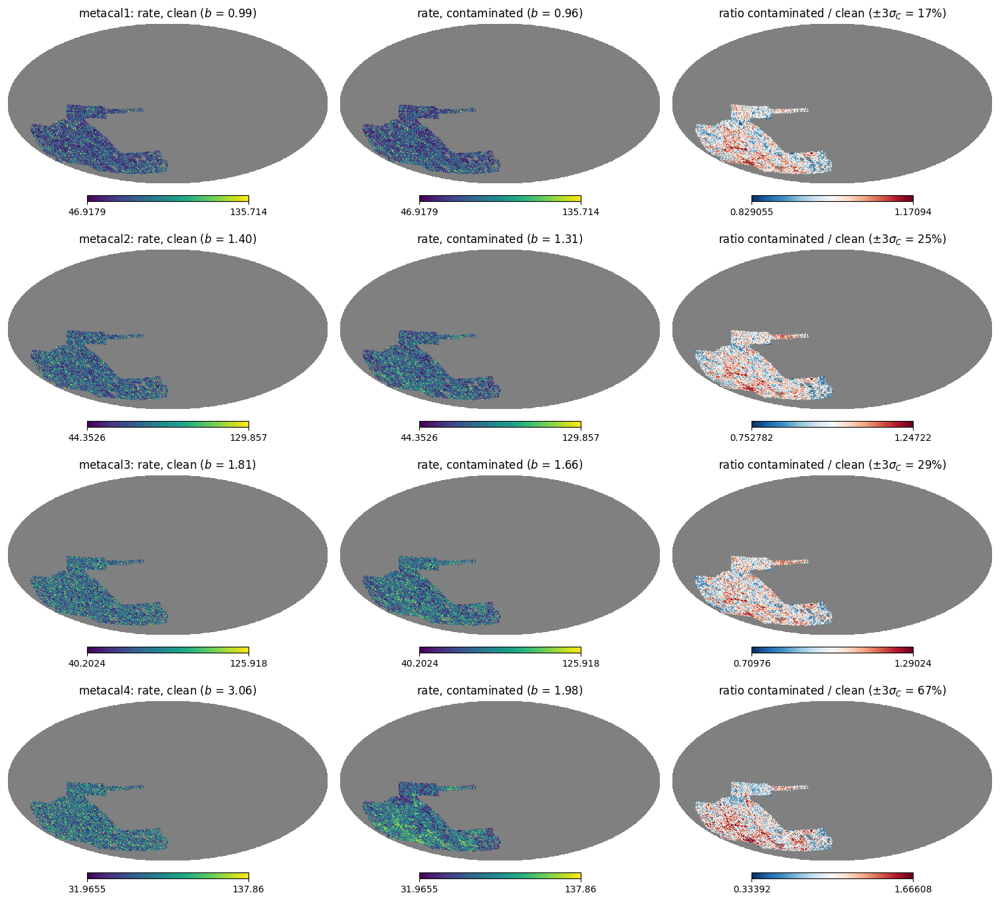

In [6]:
fig = plt.figure(figsize=(15, 3.4 * n_z))
for i in range(n_z):
    lim = limits([rate["clean"][:, i], rate["contam"][:, i]])
    panels = [
        (rate["clean"][:, i], f"{z_bins[i]}: rate, clean ($b$ = {biases['clean'][i]:.2f})", lim, "viridis"),
        (rate["contam"][:, i], f"rate, contaminated ($b$ = {biases['contam'][i]:.2f})", lim, "viridis"),
        (
            ratio(rate["contam"][:, i], rate["clean"][:, i]),
            f"ratio contaminated / clean ($\\pm 3\\sigma_C$ = {100 * (ratio_limits(i)[1] - 1):.0f}%)",
            ratio_limits(i),
            "RdBu_r",
        ),
    ]
    for j, (m, title, lim_j, cmap) in enumerate(panels):
        hp.mollview(
            masked(m), min=lim_j[0], max=lim_j[1], cmap=cmap, title=title, notext=True, cbar=True,
            sub=(n_z, 3, 3 * i + j + 1),
        )

# 2. Zoomed onto the footprint: the Poisson rate

The same three quantities over the base patch, where the pixel scale structure is resolved. The ratio column is the
legible one, and it has to show the **same** pattern in all four rows, growing in amplitude with the tomographic bin,
since the four correction maps are four amplitudes of one survey. Its colour range is $\pm 3\sigma$ of the
contamination of that bin, so each row is scaled to its own amplitude rather than to a common one.

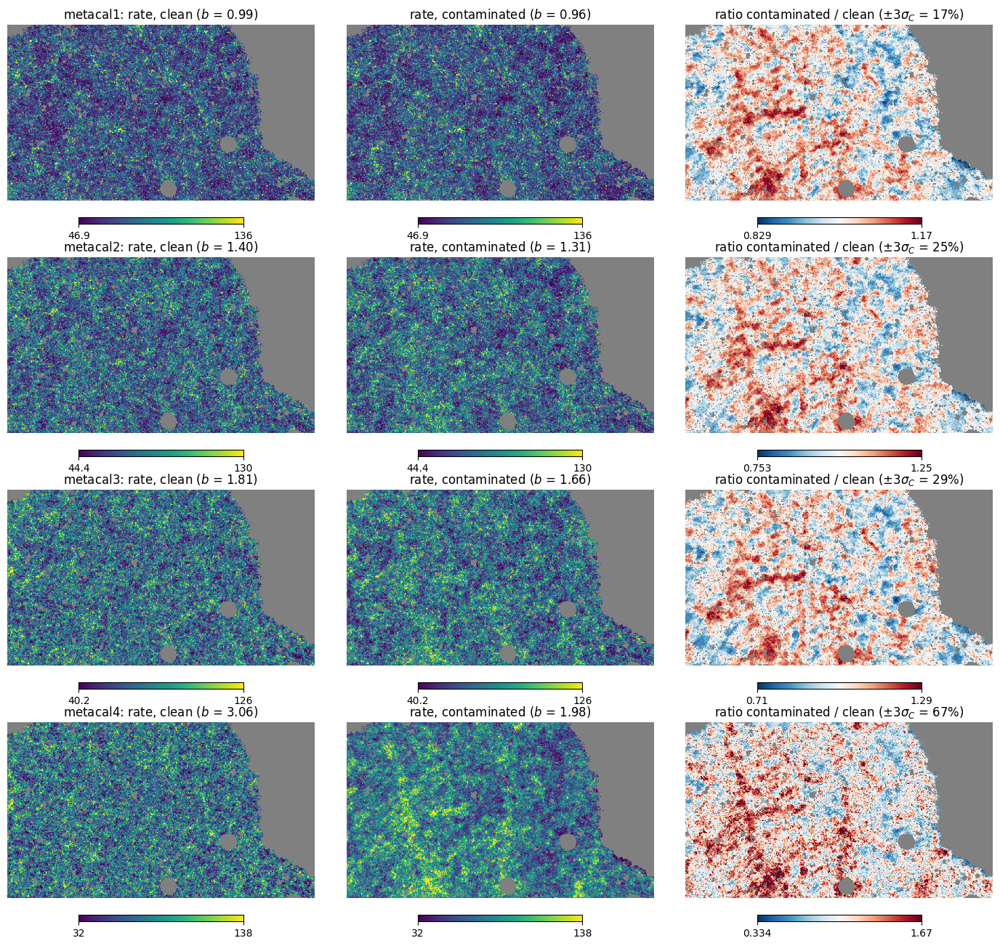

In [7]:
fig = plt.figure(figsize=(14, 3.2 * n_z))
for i in range(n_z):
    lim = limits([rate["clean"][:, i], rate["contam"][:, i]])
    panels = [
        (rate["clean"][:, i], f"{z_bins[i]}: rate, clean ($b$ = {biases['clean'][i]:.2f})", lim, "viridis"),
        (rate["contam"][:, i], f"rate, contaminated ($b$ = {biases['contam'][i]:.2f})", lim, "viridis"),
        (
            ratio(rate["contam"][:, i], rate["clean"][:, i]),
            f"ratio contaminated / clean ($\\pm 3\\sigma_C$ = {100 * (ratio_limits(i)[1] - 1):.0f}%)",
            ratio_limits(i),
            "RdBu_r",
        ),
    ]
    for j, (m, title, lim_j, cmap) in enumerate(panels):
        hp.gnomview(
            masked(m), min=lim_j[0], max=lim_j[1], cmap=cmap, title=title, notext=True, cbar=True,
            sub=(n_z, 3, 3 * i + j + 1), **GNOM_WIDE,
        )

# 3. One Poisson realization, next to DES Y3

This is what the shape noise generator actually resamples the shear catalog with. All three columns of a row share
their colour scale, the DES Y3 column included, so the comparison to the observation is a fair one in width.

The expectation is bin dependent, which is why all four rows are shown. In `metacal1` to `metacal3` the contamination
(5.7 to 9.7% per pixel) sits below the 11.8% shot noise, so the two model columns should look alike and whatever
structure the eye picks out is Poisson noise. In `metacal4` the contamination is 22.2%, twice the shot noise, and the
contaminated column has to look visibly blotchier than the clean one.

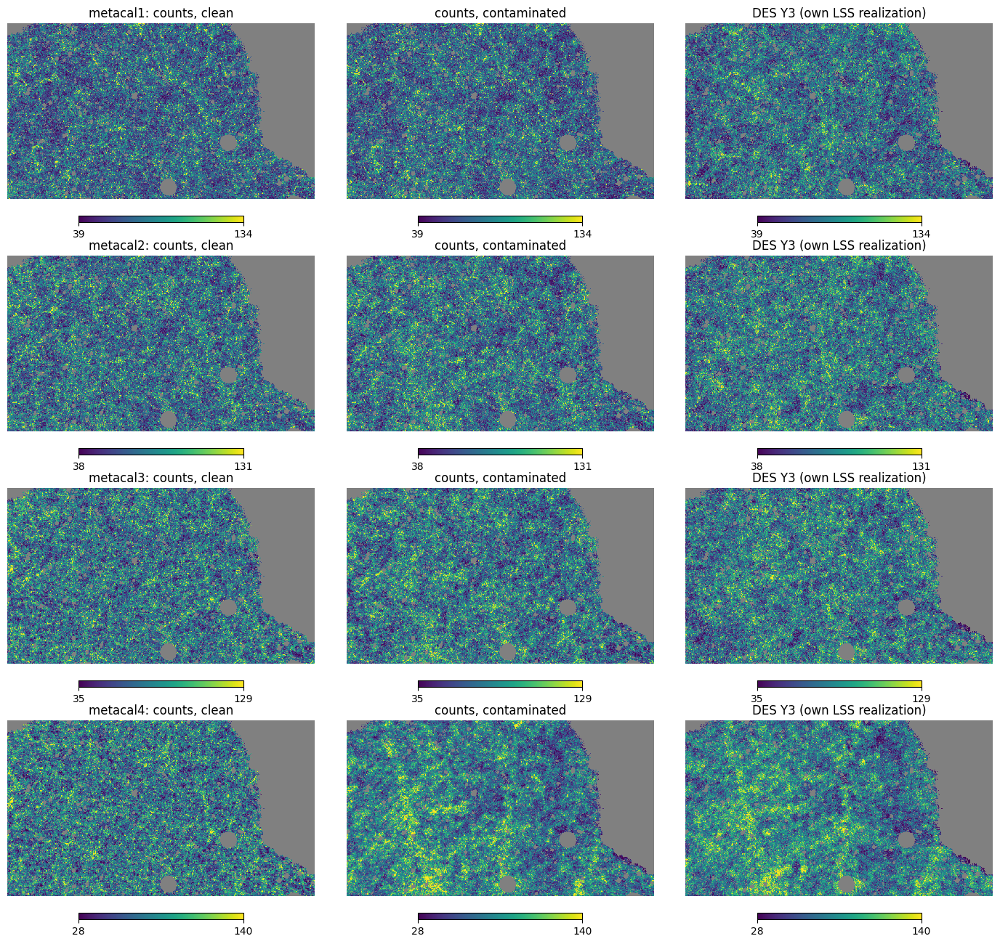

In [8]:
fig = plt.figure(figsize=(14, 3.2 * n_z))
for i in range(n_z):
    lim = limits([counts["clean"][:, i], counts["contam"][:, i], data_counts[:, i]])
    panels = [
        (counts["clean"][:, i], f"{z_bins[i]}: counts, clean", lim),
        (counts["contam"][:, i], "counts, contaminated", lim),
        (data_counts[:, i], "DES Y3 (own LSS realization)", lim),
    ]
    for j, (m, title, lim_j) in enumerate(panels):
        hp.gnomview(
            masked(m), min=lim_j[0], max=lim_j[1], cmap="viridis", title=title, notext=True, cbar=True,
            sub=(n_z, 3, 3 * i + j + 1), **GNOM_WIDE,
        )

# 4. The same realization, smoothed to $1^\circ$

Smoothing beats the shot noise down by the square root of the number of pixels in the beam and leaves the large scale
modulation, which is the scale the contamination lives on. Everything is plotted as the density contrast
$n / \bar{n}_\mathrm{fp} - 1$ of the smoothed map, on one scale per row set to $\pm 2\sigma$ of the DES Y3 panel, so
that the maps of a row are directly comparable in contrast.

The fourth column is the smoothed contamination itself, on the same scale. It is the pattern to hunt for in the second
column, and its contrast relative to the third column is how much of the observed $1^\circ$ structure the survey
systematics can account for at all.

This is the figure that carries the visual verdict. What to look for:

- the `clean` column is pure CosmoGrid large scale structure, statistically isotropic over the patch,
- the `contam` column is the same LSS with the fourth column added on top, so it should be visibly more contrasted than
  the `clean` one and should share individual features with the fourth column, most obviously in `metacal4`,
- the DES Y3 column has its own LSS realization, so only its *contrast* is comparable, not its pattern. Whether the
  contaminated model reaches that contrast while the clean one falls short of it is the point of the correction, and
  section 7 puts numbers on exactly that.

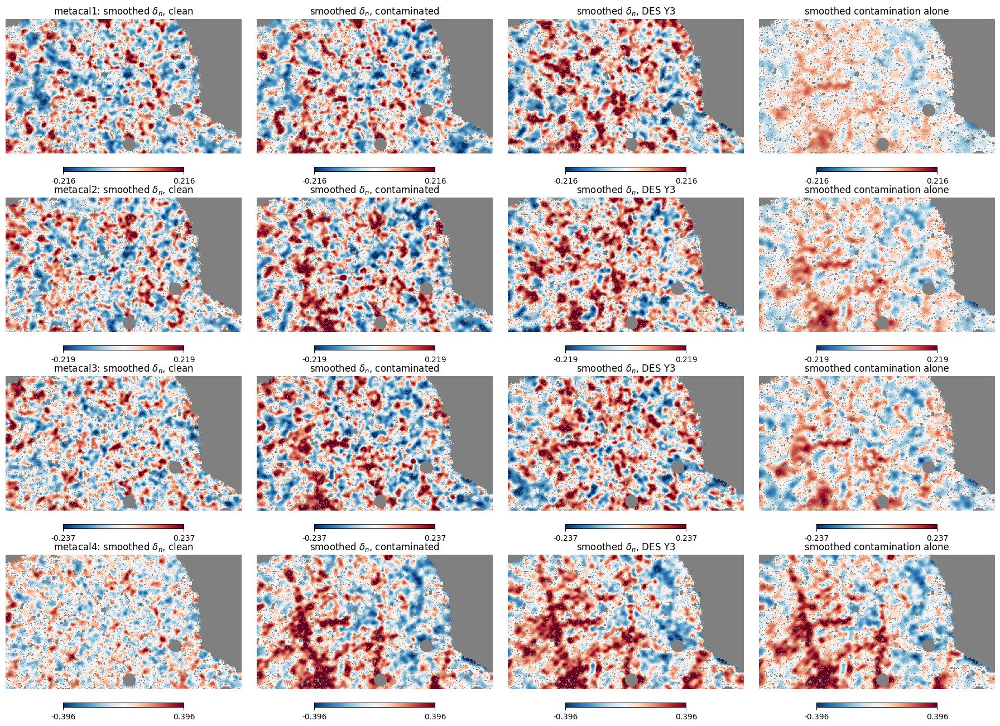

In [9]:
smooth_maps = {
    name: np.stack([smoothed(m[:, i]) for i in range(n_z)], axis=-1)
    for name, m in [("clean", counts["clean"]), ("contam", counts["contam"]), ("data", data_counts),
                    ("contamination", contamination)]
}


def smoothed_contrast(name, i_z):
    """Density contrast of a smoothed footprint map, i.e. the quantity the eye compares across the columns."""
    m = smooth_maps[name][:, i_z]

    return m / m.mean() - 1


fig = plt.figure(figsize=(18, 3.2 * n_z))
for i in range(n_z):
    # one scale per row, set by the observation, which is the widest of the four by construction
    half = 2 * smoothed_contrast("data", i).std()
    panels = [
        ("clean", f"{z_bins[i]}: smoothed $\\delta_n$, clean"),
        ("contam", "smoothed $\\delta_n$, contaminated"),
        ("data", "smoothed $\\delta_n$, DES Y3"),
        ("contamination", "smoothed contamination alone"),
    ]
    for j, (name, title) in enumerate(panels):
        hp.gnomview(
            masked(smoothed_contrast(name, i)), min=-half, max=half, cmap="RdBu_r", title=title, notext=True,
            cbar=True, sub=(n_z, 4, 4 * i + j + 1), **GNOM_WIDE,
        )

# 5. Pixel level zoom

A few pixels per plotted pixel, to confirm that nothing pathological happens at the pixel scale — no isolated pixels
driven to zero by the clip, no stripes or moiré at the resolution of the correction map, which is delivered at
nside 512 but was rotated into this frame, an operation that does not preserve pixels. The printout is the
quantitative half of that check and is also what section 6 relies on.

The third column is the difference of the two arms. The two Poisson draws share the seed but not the stream, so its
white noise floor is $\sqrt{2}$ shot noise, on top of which sit both the imprint and the change of $b$: in the first
three bins that is a wash, in `metacal4` the difference map should show the survey pattern directly.

fraction of footprint pixels the clip sent to zero
  clean        0.0000 %     0.0000 %     0.0000 %     0.0000 %
  contam       0.0000 %     0.0000 %     0.0000 %     0.0000 %


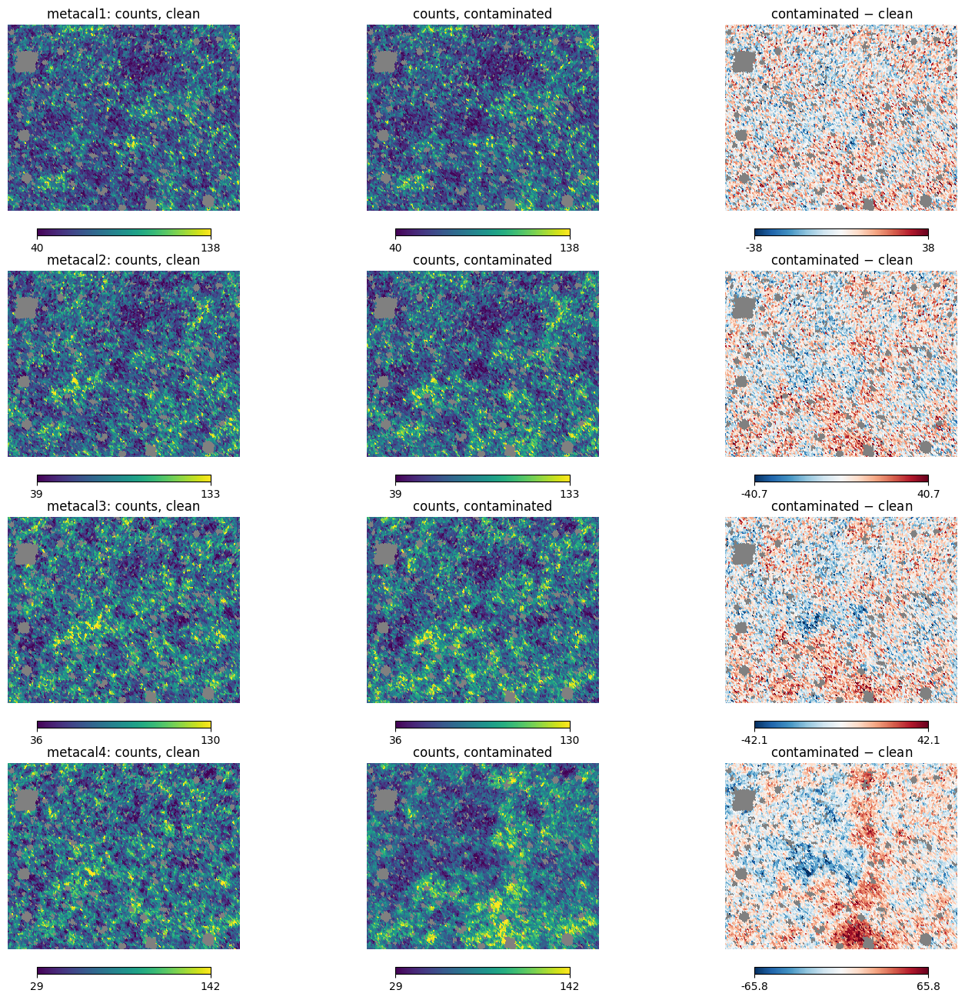

In [10]:
fig = plt.figure(figsize=(14, 3.2 * n_z))
for i in range(n_z):
    lim = limits([counts["clean"][:, i], counts["contam"][:, i]])
    diff = counts["contam"][:, i] - counts["clean"][:, i]
    panels = [
        (counts["clean"][:, i], f"{z_bins[i]}: counts, clean", lim, "viridis"),
        (counts["contam"][:, i], "counts, contaminated", lim, "viridis"),
        (diff, "contaminated $-$ clean", (-3 * diff.std(), 3 * diff.std()), "RdBu_r"),
    ]
    for j, (m, title, lim_j, cmap) in enumerate(panels):
        hp.gnomview(
            masked(m), min=lim_j[0], max=lim_j[1], cmap=cmap, title=title, notext=True, cbar=True,
            sub=(n_z, 3, 3 * i + j + 1), **GNOM_ZOOM,
        )

print("fraction of footprint pixels the clip sent to zero")
for name in arms:
    print(f"  {name:8s}" + "".join(f"   {100 * np.mean(rate[name][:, i] == 0):8.4f} %" for i in range(n_z)))

# 6. Isolating the contamination: the same bias in both arms

Sections 1 to 5 compare the two arms at their own fitted biases, which is the pair the pipeline chooses between but
changes two things at once. Holding the bias at the `clean` value leaves the contamination as the only difference, and
then the ratio of the two rates is *analytically* the contamination map: the clip is inactive at these biases
(section 5 prints 0% of pixels), so the renormalization factor is exactly 1 and nothing else survives the ratio.

That makes this the tightest available check of the plumbing rather than of the physics. The left column is measured on
the forward modelled maps and the middle one is the input map, so a frame or convention error anywhere in
`files.get_metacal_systematics` -> `galaxy_density_to_count` — a missed rotation, a flipped parity, the `weight`
dataset instead of `contamination` — shows up as two columns that do not match. The pass condition is a blank third
column, zero to machine precision, and it is the third column that would catch a clip quietly eating pixels somewhere.

bin          median |ratio - C|    max |ratio - C|
metacal1              3.479e-08          1.568e-07
metacal2              1.169e-07          2.577e-07
metacal3              1.275e-07          2.809e-07
metacal4              2.726e-08          1.967e-07


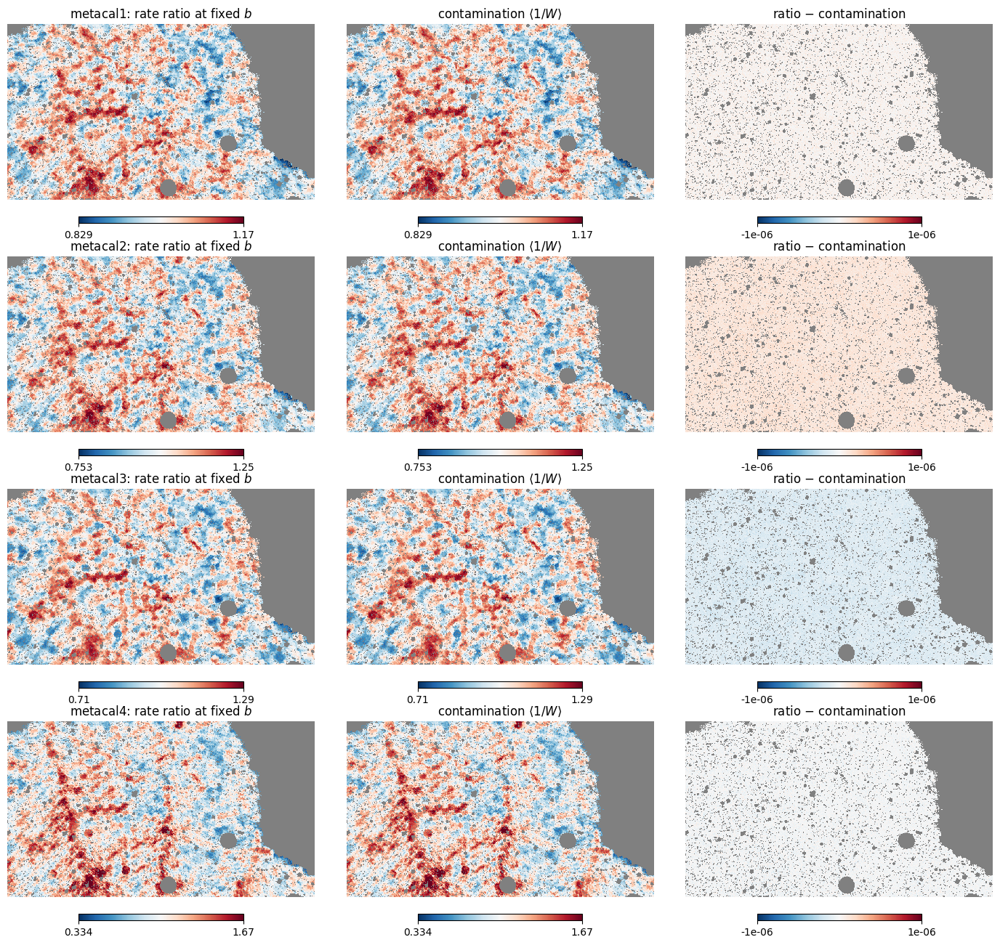

In [11]:
rate_fixed_b = np.stack(
    [
        clustering.galaxy_density_to_count(
            n_bar[i], delta[:, i], biases["clean"][i], contamination_map=contamination[:, i]
        )
        for i in range(n_z)
    ],
    axis=-1,
)

fig = plt.figure(figsize=(14, 3.2 * n_z))
for i in range(n_z):
    measured = ratio(rate_fixed_b[:, i], rate["clean"][:, i])
    seen = measured != hp.UNSEEN
    residual = np.full_like(measured, hp.UNSEEN)
    residual[seen] = measured[seen] - contamination[seen, i]
    panels = [
        (measured, f"{z_bins[i]}: rate ratio at fixed $b$", ratio_limits(i), "RdBu_r"),
        (contamination[:, i], "contamination $\\langle 1/W \\rangle$", ratio_limits(i), "RdBu_r"),
        (residual, "ratio $-$ contamination", (-1e-6, 1e-6), "RdBu_r"),
    ]
    for j, (m, title, lim_j, cmap) in enumerate(panels):
        hp.gnomview(
            masked(m), min=lim_j[0], max=lim_j[1], cmap=cmap, title=title, notext=True, cbar=True,
            sub=(n_z, 3, 3 * i + j + 1), **GNOM_WIDE,
        )

print(f"{'bin':<10} {'median |ratio - C|':>20} {'max |ratio - C|':>18}")
for i in range(n_z):
    measured = ratio(rate_fixed_b[:, i], rate["clean"][:, i])
    seen = measured != hp.UNSEEN
    res = np.abs(measured[seen] - contamination[seen, i])
    print(f"{z_bins[i]:<10} {np.median(res):>20.3e} {res.max():>18.3e}")

    # the identity only holds while the clip is inactive, which is what makes this a plumbing check
    assert res.max() < 1e-5, f"the rate ratio does not reproduce the contamination map in {z_bins[i]}"

# 7. What the eye is looking at, in numbers

The scales that decide which of the panels above can show anything: the per pixel width of the contamination against
shot noise, and the width of the count maps before and after the $1^\circ$ beam.

The `raw` columns are what the fit matched, so all three agree there by construction. That is the histogram statement
of `sc_bias_fit_count.ipynb` and it is *not* independent evidence. The `1 deg` columns are, because nothing in the fit
constrained them: the clean arm is left well below the observed large scale width while the contaminated arm lands on
it, most starkly in `metacal4`. That is the number behind the eye check of section 4, and the strongest quantitative
argument in this notebook that the correction does something real rather than trading $b$ against an arbitrary map.

The downstream question — whether the imprint survives into the shear noise maps the network actually sees — is
answered in `shape_noise_comparison.ipynb`, which picks the chain up where this notebook stops.

In [12]:
# pixels averaged over by the 1 deg fwhm beam of section 4, and the factor it beats shot noise down by
n_beam = np.pi * (0.5 * 60 / hp.nside2resol(n_side, arcmin=True)) ** 2
print(f"a 1 deg fwhm beam covers ~{n_beam:.0f} pixels, beating shot noise down by ~{np.sqrt(n_beam):.0f}x")

rms = lambda m: 100 * m.std() / m.mean()  # noqa: E731, per pixel width in per cent of the mean
sources = {"clean": counts["clean"], "contam": counts["contam"], "DES Y3": data_counts}

header = ["contam", "shot"] + [f"raw {n}" for n in sources] + [f"1 deg {n}" for n in sources]
print("\nper pixel rms in % of the mean")
print(f"{'bin':<10}" + "".join(f"{h:>14s}" for h in header))
for i in range(n_z):
    row = [100 * contamination[:, i].std(), 100 / np.sqrt(n_bar[i])]
    row += [rms(m[:, i]) for m in sources.values()]
    row += [rms(smooth_maps[key][:, i]) for key in ("clean", "contam", "data")]
    print(f"{z_bins[i]:<10}" + "".join(f"{v:>14.2f}" for v in row))

a 1 deg fwhm beam covers ~60 pixels, beating shot noise down by ~8x

per pixel rms in % of the mean
bin               contam          shot     raw clean    raw contam    raw DES Y3   1 deg clean  1 deg contam  1 deg DES Y3
metacal1            5.70         11.77         27.92         27.73         25.84          9.60         10.20         10.81
metacal2            8.24         11.68         26.86         26.94         26.25          9.30         11.00         10.95
metacal3            9.67         11.78         27.61         27.60         27.10          9.52         11.90         11.84
metacal4           22.20         11.69         33.02         32.55         32.33         11.23         19.54         19.78
